In [55]:
# Adapted from M.X. Cohen

import numpy as np
import math
import matplotlib.pyplot as plt
import random
import timeit
import scipy.fftpack
import scipy.io as sio
from scipy import stats
from scipy import signal
from scipy import interpolate
from PIL import Image
from skimage import filters
import scipy.ndimage as ndimage
import scipy
import imageio
from skimage.morphology import disk

# Google Sheets Link

https://docs.google.com/document/d/1ZRc-jSjPBN2ZQVElUd9T-Lfzk6sQjUbP3qRj14w4L9Q/edit?ts=5e8cc5e4

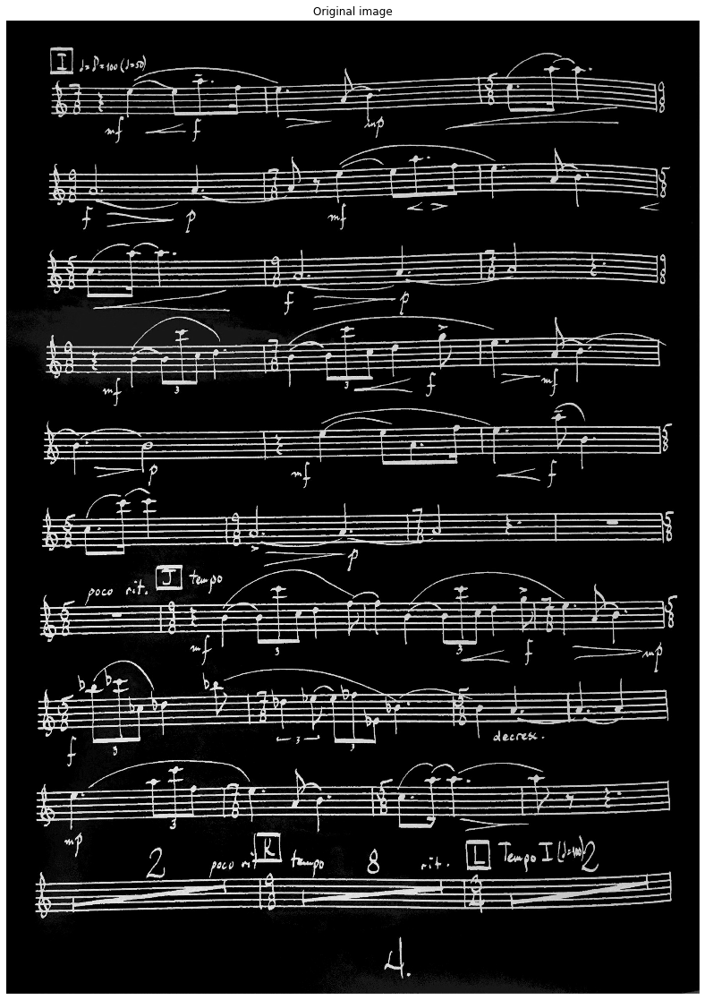

In [15]:
music = np.asarray(Image.open("nc4.jpg"))
red = music[..., 0]
green = music[..., 1]
blue = music[..., 2]

music = 0.21 * red + 0.72 * green + 0.07 * blue
music = ~(music.astype(np.uint8))

# plot original image
plt.figure(figsize=(30, 20))
plt.imshow(music, cmap=plt.cm.gray)
plt.axis('off')
plt.title('Original image')

plt.show()



"\n# filter kernel is a Gaussian: size of filter is size of image\nwidth = .1 # width of gaussian (normalized Z units)\nlims  = np.shape(astro)\nxr    = stats.zscore(np.arange(lims[0]))\n[x,y] = np.meshgrid(xr, xr)\n\n# add 1- at beginning of the next line to invert the filter\ngaus2d = np.exp(-(x ** 2 + y ** 2) / (2 * width ** 2))\n\n# show Gaussian\nplt.subplot2grid((2,3), (1,1))\nplt.imshow(gaus2d, cmap=plt.cm.gray)\nplt.axis('off')\nplt.title('Gain function')\n\n# show modulated spectrum\nplt.subplot2grid((2,3), (1,2))\nplt.imshow(np.log(np.abs(np.multiply(imgX, gaus2d))), cmap=plt.cm.gray)\nplt.axis('off')\nplt.clim([0, 15])\nplt.title('Modulated spectrum')\n\n# and the reconstructed image\nimgrecon = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((imgX * gaus2d))))\n\nplt.subplot2grid((2, 2), (0, 1))\nplt.imshow(imgrecon, cmap=plt.cm.gray)\nplt.axis('off')\nplt.title('Filtered image')\n"

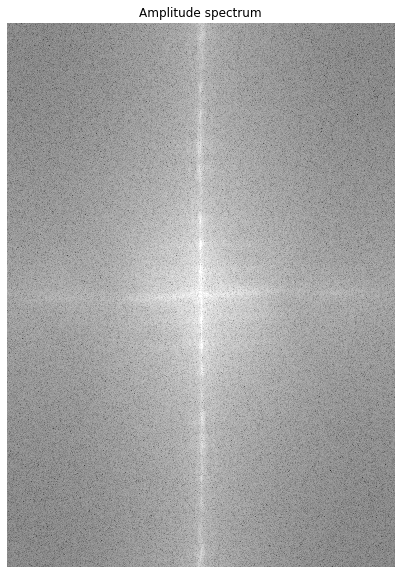

In [32]:

# and its power spectrum
imgX  = scipy.fftpack.fftshift(scipy.fftpack.fft2(music))
powr2 = np.log(np.abs(imgX))

plt.figure(figsize=(20, 10))
plt.imshow(powr2, cmap=plt.cm.gray)
plt.clim([0, 15])
plt.axis('off')
plt.title('Amplitude spectrum')

'''
# filter kernel is a Gaussian: size of filter is size of image
width = .1 # width of gaussian (normalized Z units)
lims  = np.shape(astro)
xr    = stats.zscore(np.arange(lims[0]))
[x,y] = np.meshgrid(xr, xr)

# add 1- at beginning of the next line to invert the filter
gaus2d = np.exp(-(x ** 2 + y ** 2) / (2 * width ** 2))

# show Gaussian
plt.subplot2grid((2,3), (1,1))
plt.imshow(gaus2d, cmap=plt.cm.gray)
plt.axis('off')
plt.title('Gain function')

# show modulated spectrum
plt.subplot2grid((2,3), (1,2))
plt.imshow(np.log(np.abs(np.multiply(imgX, gaus2d))), cmap=plt.cm.gray)
plt.axis('off')
plt.clim([0, 15])
plt.title('Modulated spectrum')

# and the reconstructed image
imgrecon = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((imgX * gaus2d))))

plt.subplot2grid((2, 2), (0, 1))
plt.imshow(imgrecon, cmap=plt.cm.gray)
plt.axis('off')
plt.title('Filtered image')
'''
#plt.show()

In [67]:
selem = disk(100)
x_middle = int(imgX.shape[1]/2)


In [65]:
patch = np.ones((40,40), dtype = bool)

In [80]:
vert_area=imgX[0: imgX.shape[0]-1, x_middle-50: x_middle+50]
i=0
while i+100 < vert_area.shape[1]:
    patch = vert_area[0: vert_area.shape[1]-1, i: i + 100]
    

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: ComplexWarning: Casting complex values to real discards the imaginary part
  """


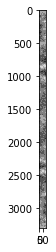

In [81]:
from skimage.filters import threshold_otsu, rank
radius = 50
selem = disk(radius)

vert_area = vert_area.astype(np.uint8)
local_otsu = rank.otsu(vert_area, selem)
plt.figure()
plt.imshow(local_otsu, cmap='gray')


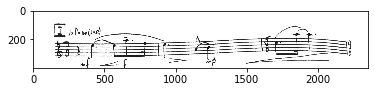

In [3]:
part = music.copy()

part=part[0: 400, 0: 2350-1]

plt.figure()
plt.imshow(part, cmap=plt.cm.gray )

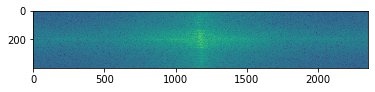

In [4]:
partx  = scipy.fftpack.fftshift(scipy.fftpack.fft2(part))
plt.figure()
plt.imshow(np.log(np.abs(partx)))

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in log
  import sys


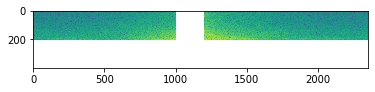

In [5]:
part1=partx.copy()

part1[0: 400-1, 1000: 1200]=0
#part1[0: 170, 0: 2350-1]=0
part1[210: 400-1, 0: 2350-1]=0
plt.figure()
plt.imshow(np.log(np.abs(part1)))

(-0.5, 2348.5, 399.5, -0.5)

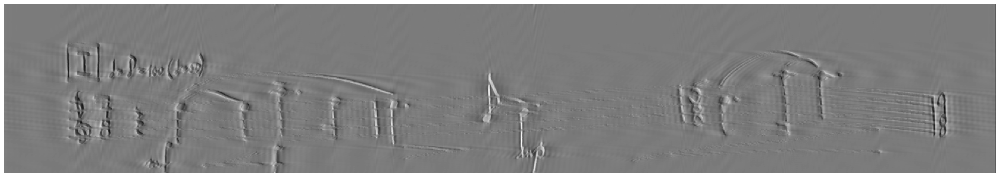

In [6]:
partrecon1 = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((part1))))
plt.figure(figsize=(30, 20))
plt.imshow(partrecon1, cmap=plt.cm.gray)
plt.axis('off')

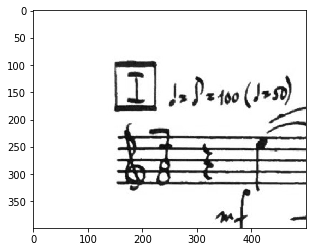

In [7]:
square = music.copy()
square = square[0: 400-1, 0: 500]

plt.figure()
plt.imshow(square, cmap=plt.cm.gray )

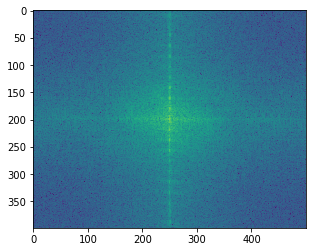

In [8]:
squarex  = scipy.fftpack.fftshift(scipy.fftpack.fft2(square))
plt.figure()
plt.imshow(np.log(np.abs(squarex)))

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log
  if __name__ == '__main__':


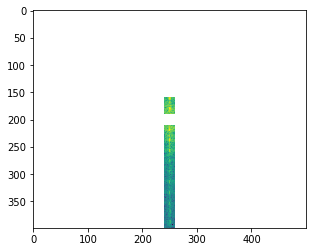

In [73]:
sqare1=squarex.copy()

sqare1[0: 400-1, 0: 240]=0
sqare1[0: 400-1, 260: 500]=0
sqare1[0: 160, 0: 500]=0
sqare1[190: 210, 0: 500]=0
#sqare1[250: 400, 0: 500]=0
plt.figure()
plt.imshow(np.log(np.abs(sqare1)))

(-0.5, 499.5, 398.5, -0.5)

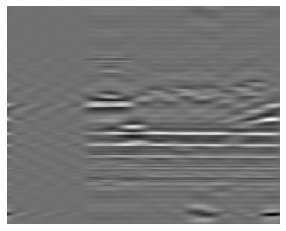

In [74]:
partrecon1 = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((sqare1))))
plt.figure()
plt.imshow(partrecon1, cmap=plt.cm.gray)
plt.axis('off')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  """


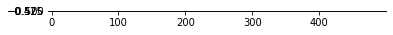

In [11]:
square2=part.copy()
square2 = square2[400:800, 0: 500]

plt.figure()
plt.imshow(square2, cmap=plt.cm.gray )

In [12]:
print(powr2.shape)

(3300, 2350)


In [13]:
np.max(powr2)

21.29628698881109

In [14]:
np.min(powr2)

0.8392506137639805

In [15]:
test1=imgX.copy()
test1[1900:3300-1, 0: 2350-1]=0
test1[0: 1500, 0: 2350-1]=0

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log
  


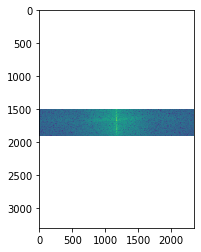

In [16]:
plt.figure()
plt.imshow(np.log(np.abs(test1)))

(-0.5, 2349.5, 3299.5, -0.5)

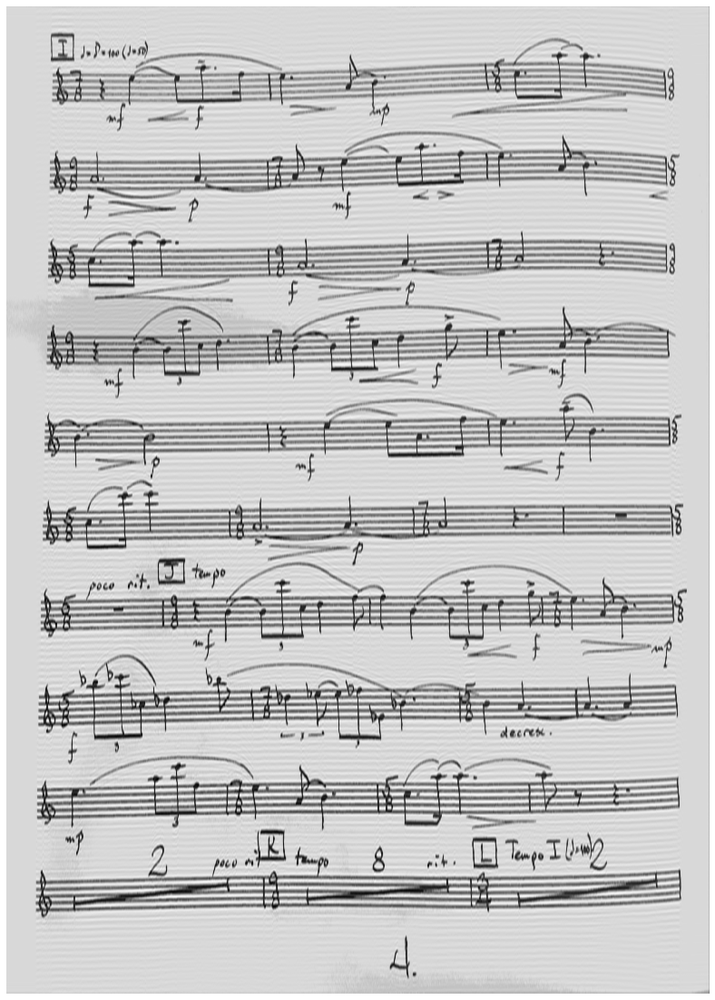

In [17]:
imgrecon = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((test1))))
plt.figure(figsize=(30, 20))
plt.imshow(imgrecon, cmap=plt.cm.gray)
plt.axis('off')

In [18]:
test2=imgX.copy()
test2[0:3300-1, 0: 1050-1]=0
test2[0:3300-1, 1350: 2350]=0

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log
  


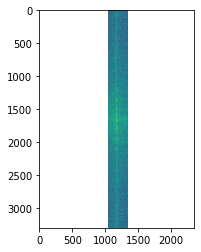

In [19]:
plt.figure()
plt.imshow(np.log(np.abs(test2)))

(-0.5, 2349.5, 3299.5, -0.5)

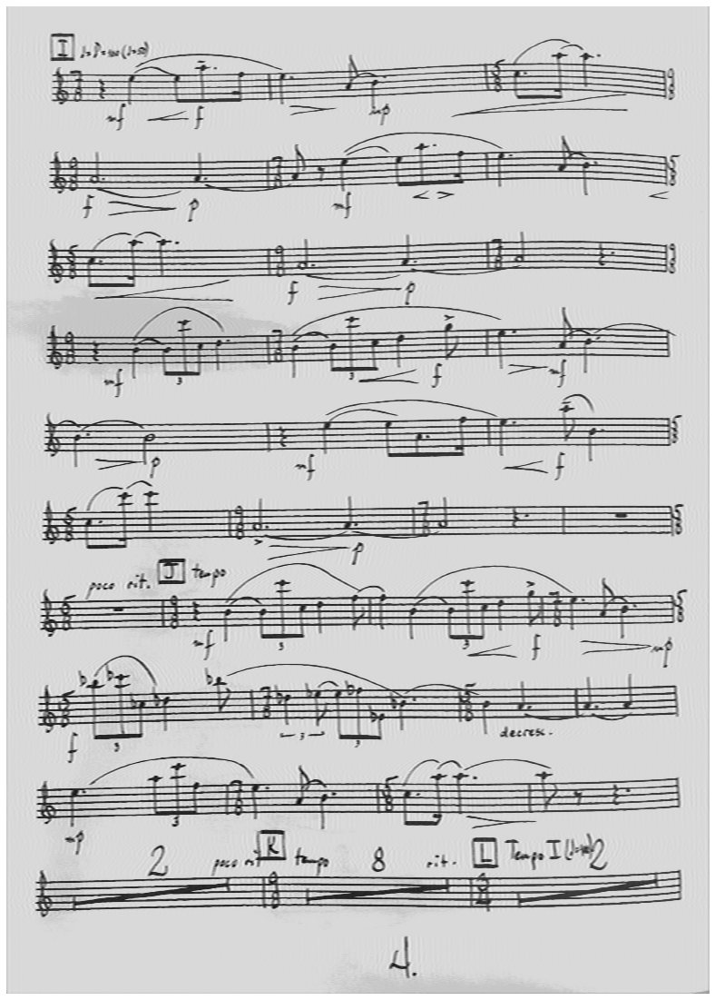

In [20]:
imgrecon2 = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((test2))))
plt.figure(figsize=(30, 20))
plt.imshow(imgrecon2, cmap=plt.cm.gray)
plt.axis('off')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log
  """


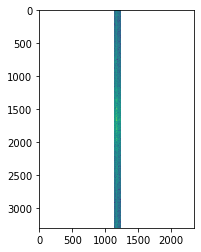

In [21]:
test3=imgX.copy()
test3[0:3300-1, 0: 1130]=0
test3[0:3300-1, 1250: 2350-1]=0
plt.figure()
plt.imshow(np.log(np.abs(test3)))

(-0.5, 2349.5, 3299.5, -0.5)

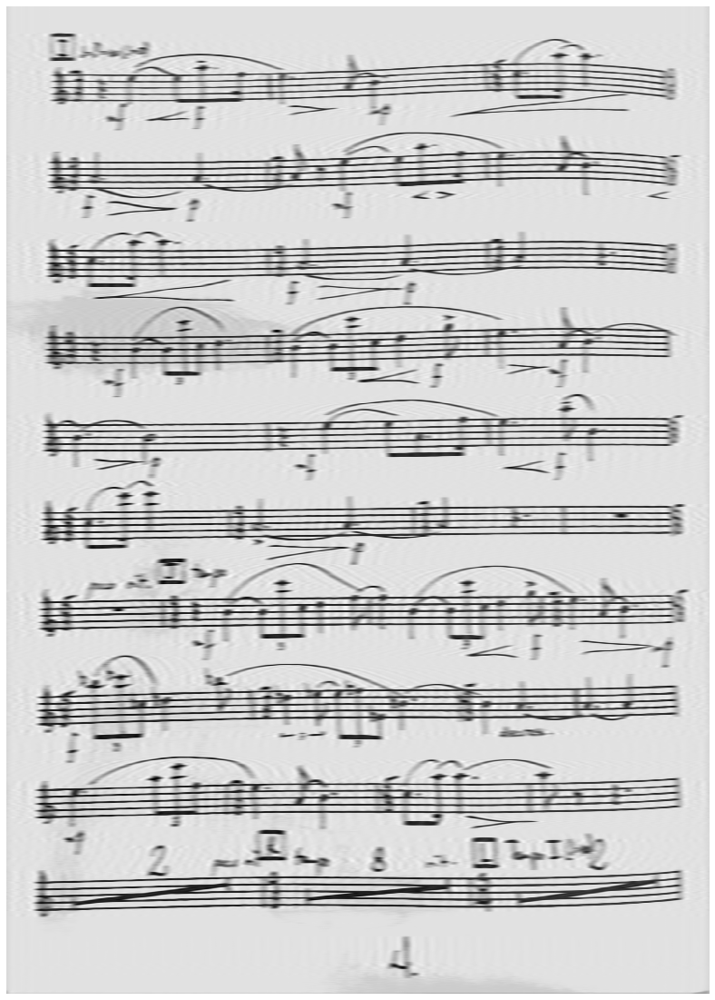

In [22]:
imgrecon3 = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((test3))))
plt.figure(figsize=(30, 20))
plt.imshow(imgrecon3, cmap=plt.cm.gray)
plt.axis('off')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log
  """


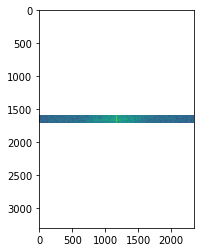

In [23]:
test4=imgX.copy()
test4[0: 1590, 0: 2350-1]=0
test4[1710:3300-1, 0: 2350-1]=0
plt.figure()
plt.imshow(np.log(np.abs(test4)))

(-0.5, 2349.5, 3299.5, -0.5)

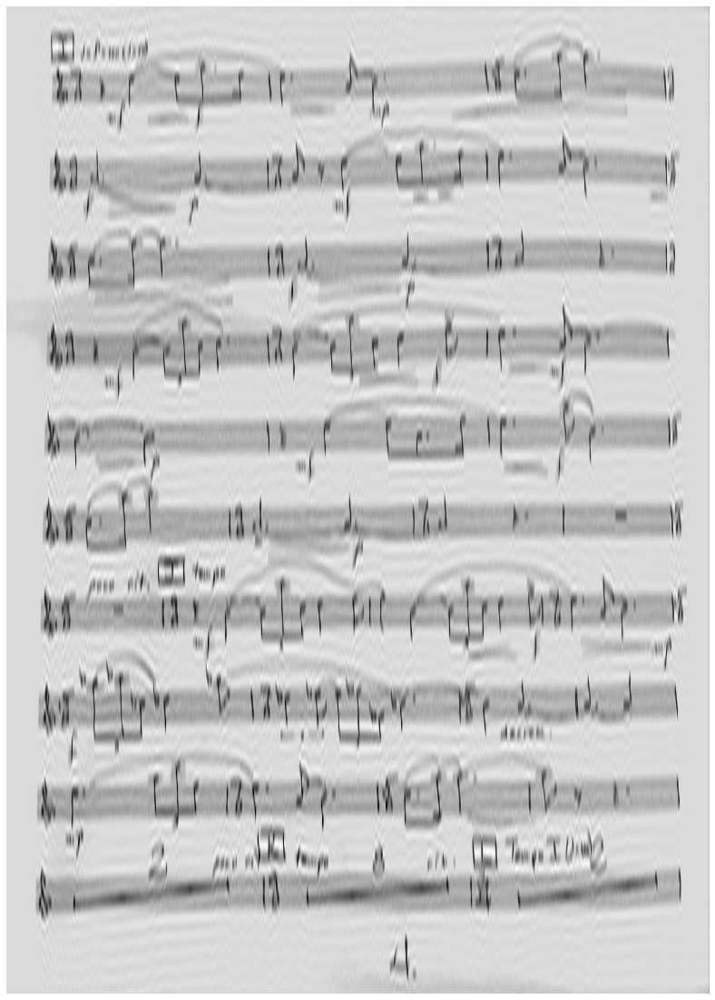

In [24]:
imgrecon4 = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((test4))))
plt.figure(figsize=(30, 20))
plt.imshow(imgrecon4, cmap=plt.cm.gray)
plt.axis('off')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log
  """


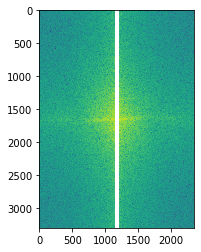

In [25]:
test5=imgX.copy()
test5[0: 3300-1, 1150: 1210]=0
#test5[2000:3300-1, 1150: 1210]=0
plt.figure()
plt.imshow(np.log(np.abs(test5)))

(-0.5, 2349.5, 3299.5, -0.5)

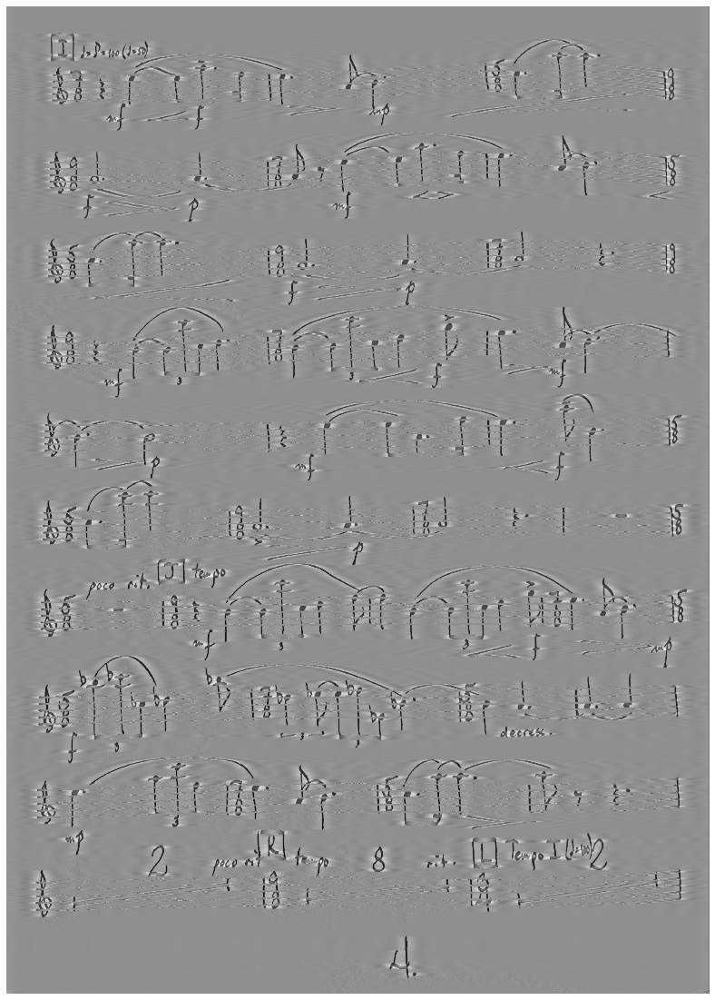

In [26]:
imgrecon5 = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((test5))))
plt.figure(figsize=(30, 20))
plt.imshow(imgrecon5, cmap=plt.cm.gray)
plt.axis('off')

In [27]:
imgrecon5[imgrecon5 >= -50]=1
imgrecon5[imgrecon5 < -50]=0

(-0.5, 2349.5, 3299.5, -0.5)

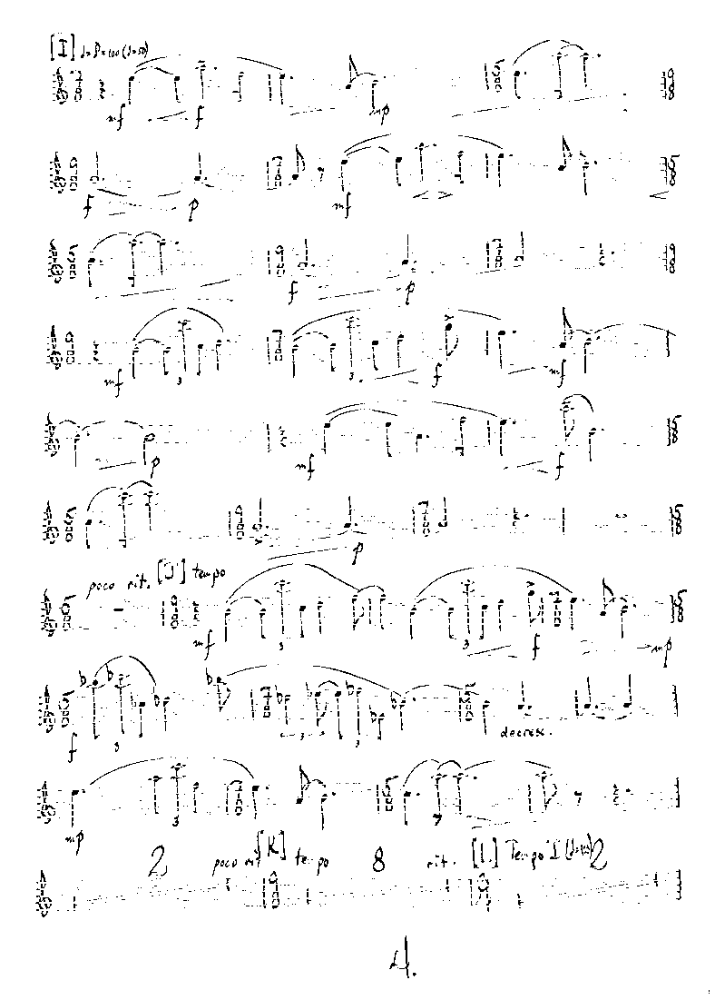

In [28]:
plt.figure(figsize=(30, 20))
plt.imshow(imgrecon5, cmap=plt.cm.gray)
plt.axis('off')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log
  


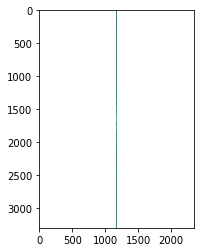

In [29]:
test6=imgX.copy()
test6[0: 3300-1, 0: 1175]=0
test6[0: 3300-1, 1185: 2350-1]=0
#test5[2000:3300-1, 1150: 1210]=0
plt.figure()
plt.imshow(np.log(np.abs(test6)))

(-0.5, 2349.5, 3299.5, -0.5)

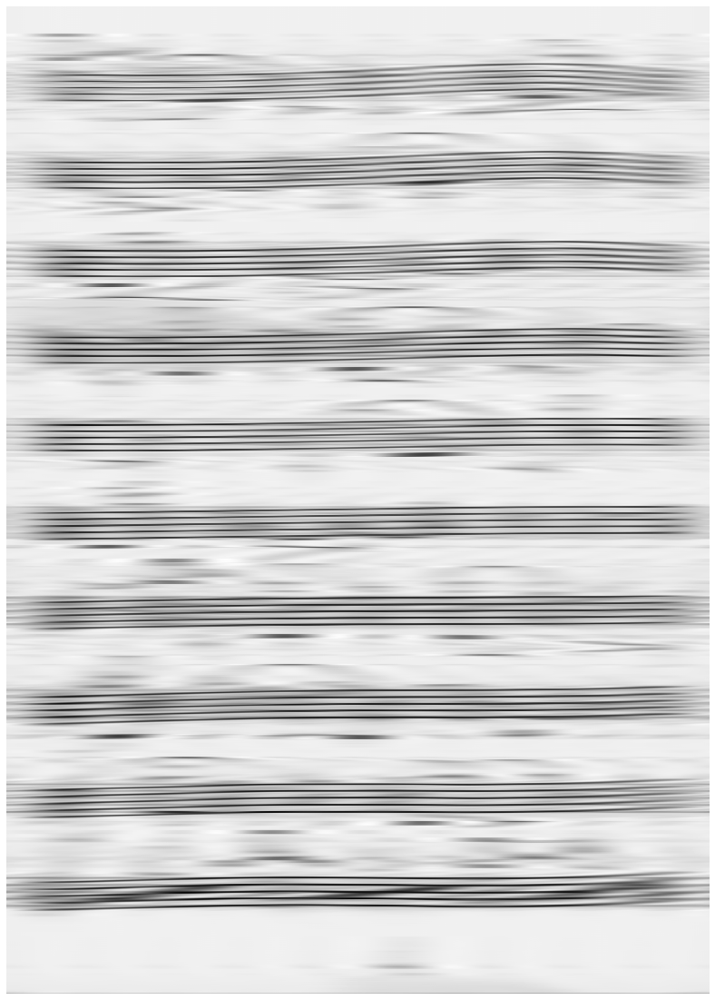

In [30]:
imgrecon6 = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((test6))))
plt.figure(figsize=(30, 20))
plt.imshow(imgrecon6, cmap=plt.cm.gray)
plt.axis('off')

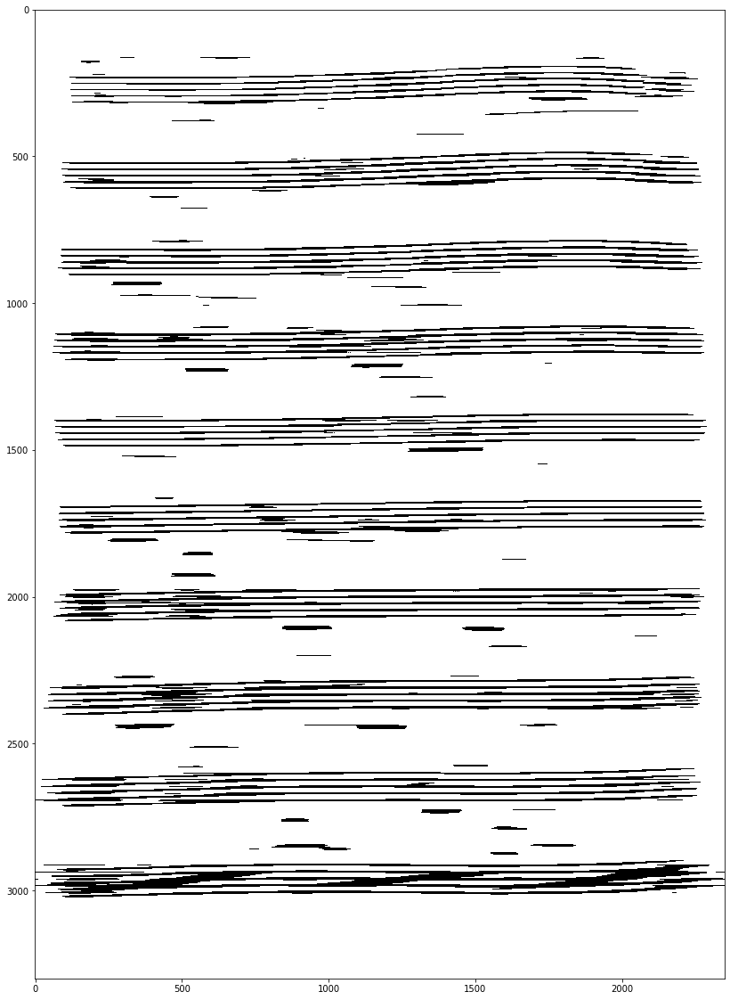

In [31]:
plt.figure(figsize=(30, 20))
val = filters.threshold_otsu(imgrecon6)
plt.imshow(imgrecon6 > val, cmap='gray')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log
  if __name__ == '__main__':


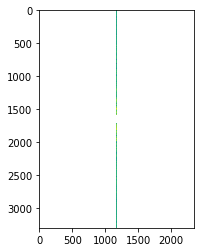

In [32]:
test7=imgX.copy()
test7[0: 3300-1, 0: 1175]=0
test7[0: 3300-1, 1185: 2350-1]=0

test7[1585:1715, 0: 2350-1]=0

#test5[2000:3300-1, 1150: 1210]=0
plt.figure()
plt.imshow(np.log(np.abs(test7)))




(-0.5, 2349.5, 3299.5, -0.5)

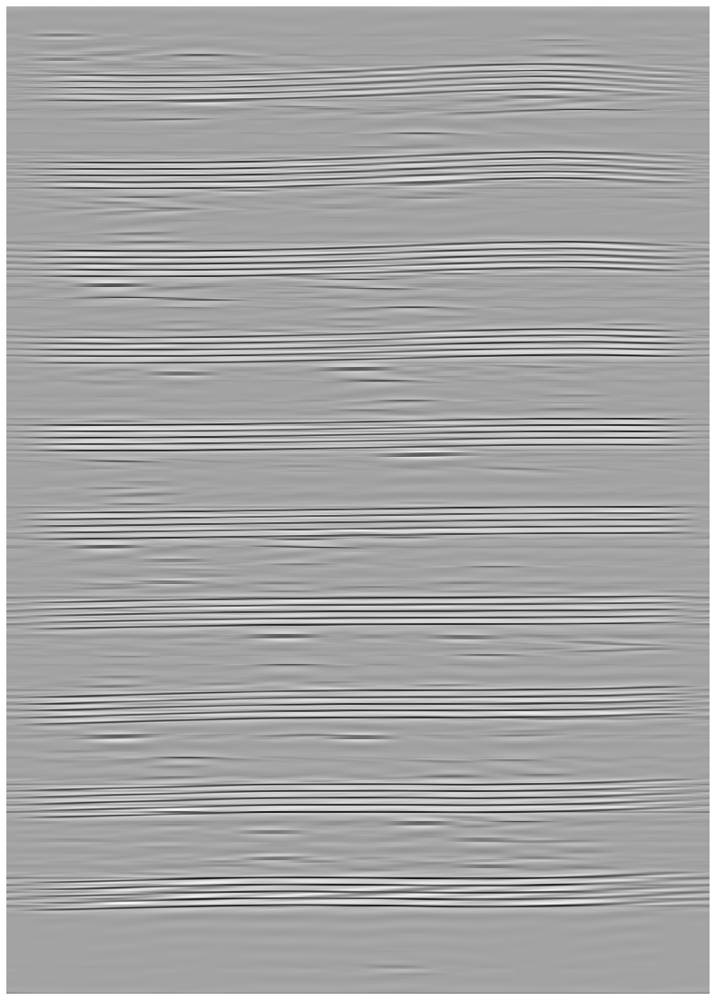

In [33]:
imgrecon7 = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((test7))))
plt.figure(figsize=(30, 20))
plt.imshow(imgrecon7, cmap=plt.cm.gray)
plt.axis('off')

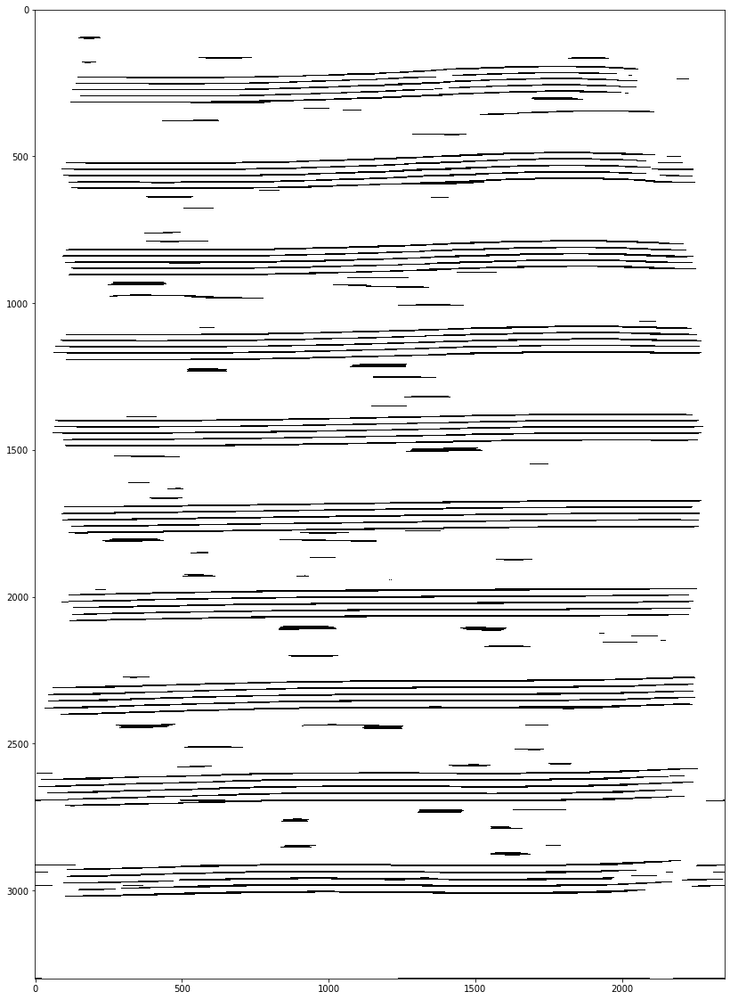

In [34]:
plt.figure(figsize=(30, 20))
val = filters.threshold_otsu(imgrecon7)
plt.imshow(imgrecon7 > val, cmap='gray')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log
  if __name__ == '__main__':


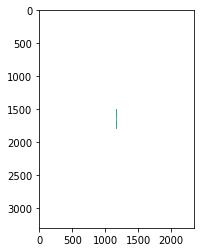

In [35]:
test8=imgX.copy()
test8[0: 3300-1, 0: 1170]=0
test8[0: 3300-1, 1185: 2350-1]=0

test8[0: 1500, 0: 2350-1]=0
test8[1800: 3300-1, 0:2350-1]=0
#test5[2000:3300-1, 1150: 1210]=0
plt.figure()
plt.imshow(np.log(np.abs(test8)))



(-0.5, 2349.5, 3299.5, -0.5)

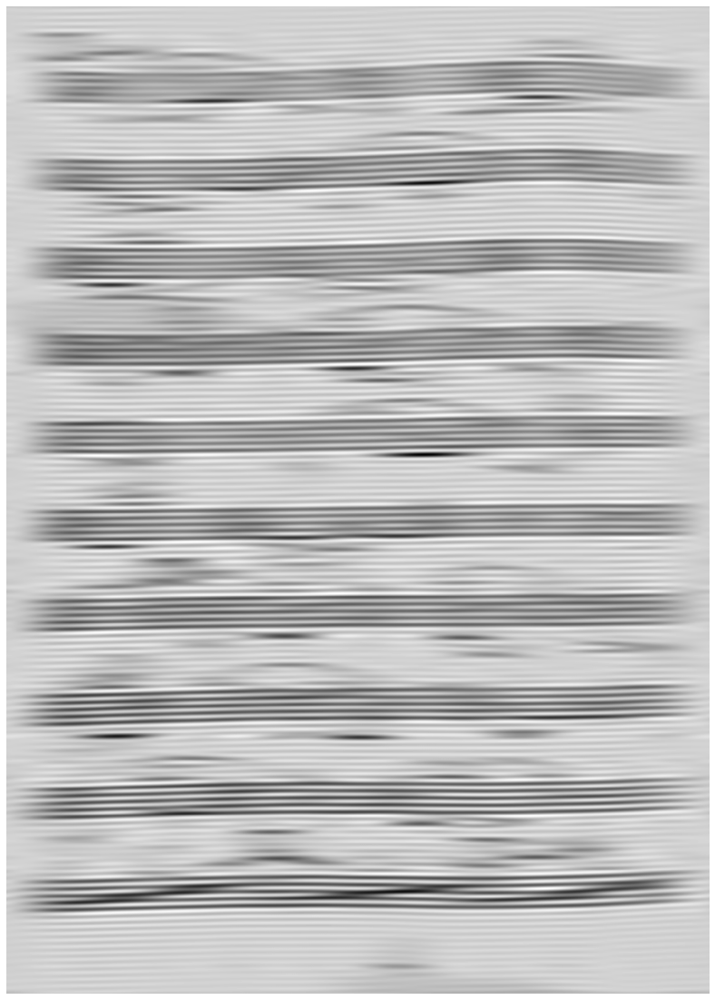

In [36]:
imgrecon8 = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((test8))))
plt.figure(figsize=(30, 20))
plt.imshow(imgrecon8, cmap=plt.cm.gray)
plt.axis('off')

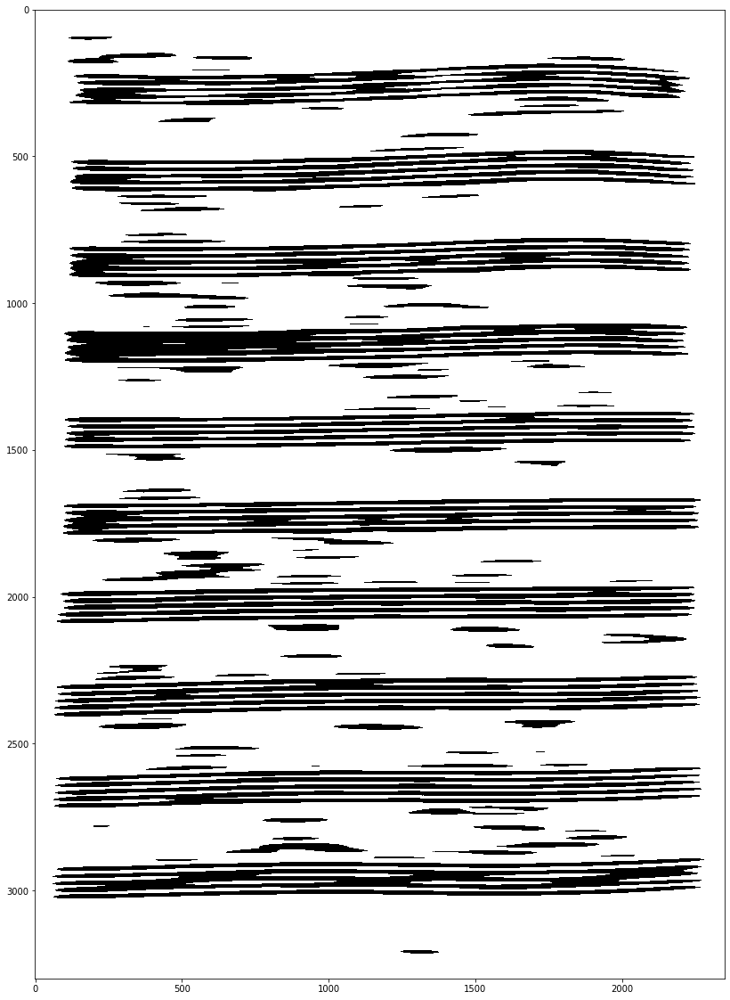

In [37]:
plt.figure(figsize=(30, 20))
val = filters.threshold_otsu(imgrecon8)
plt.imshow(imgrecon8 > val, cmap='gray')

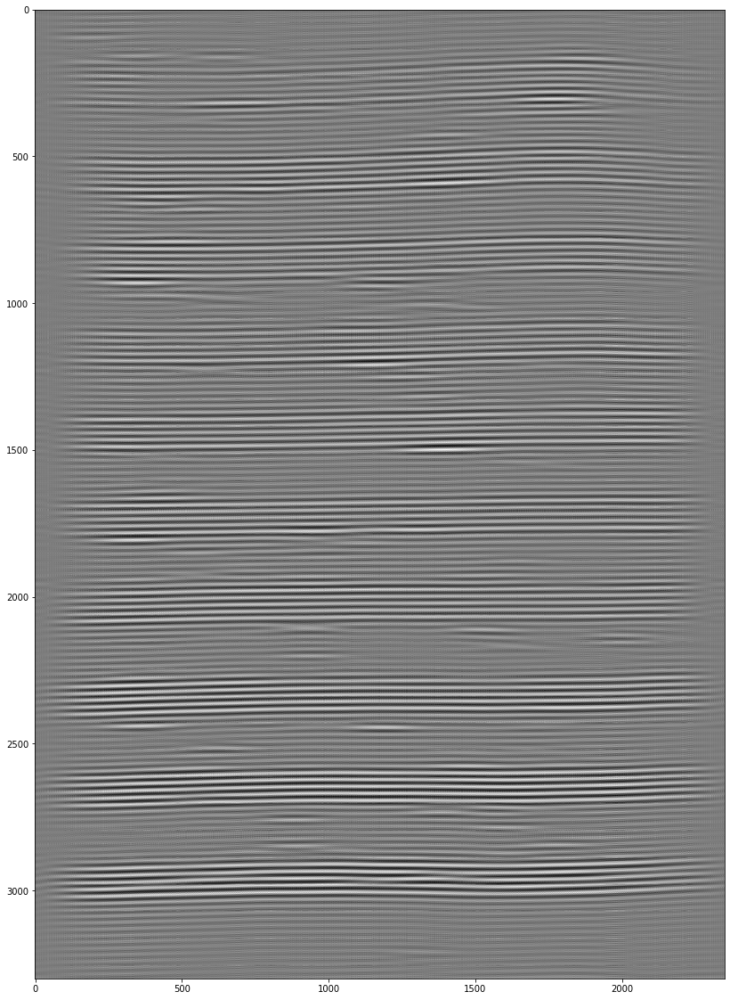

In [38]:
plt.figure(figsize=(30, 20))
recomlaplace8= ndimage.filters.laplace(imgrecon8)
plt.imshow(recomlaplace8, cmap='gray')

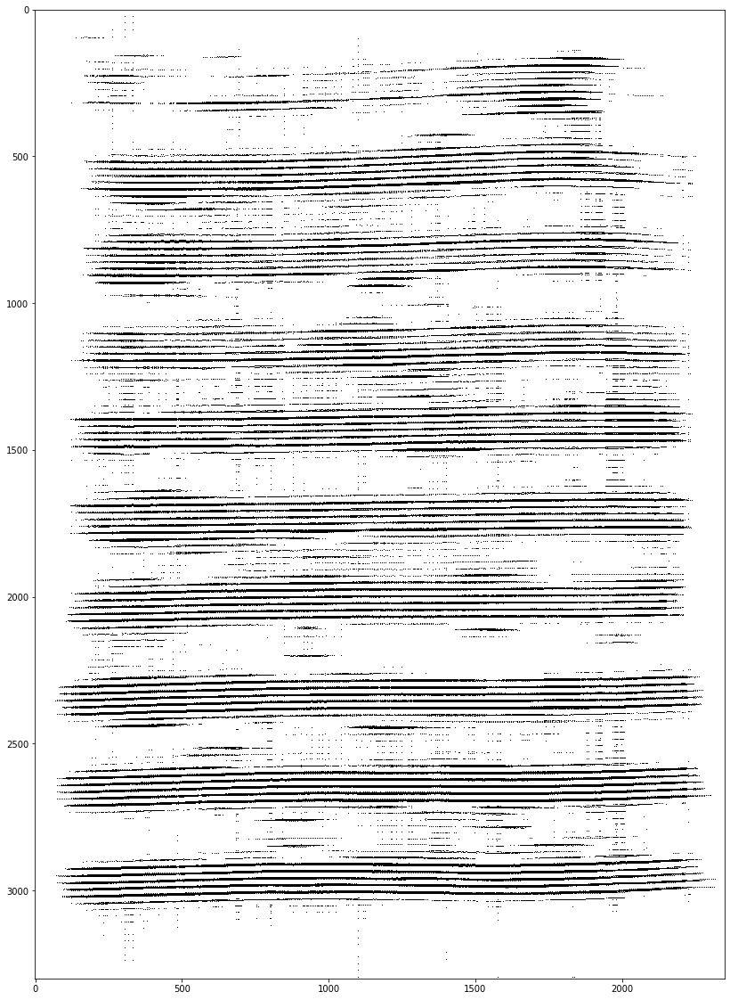

In [39]:
plt.figure(figsize=(30, 20))
val = 2
plt.imshow(recomlaplace8 < val, cmap='gray')

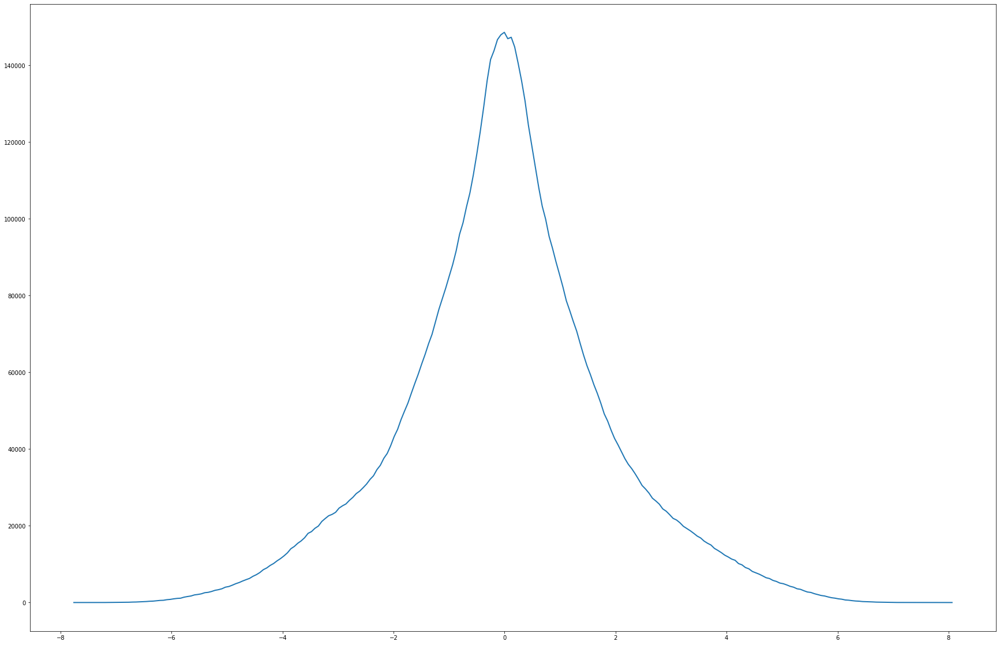

In [40]:

from skimage import exposure
plt.figure(figsize=(30, 20))
hist, bins_center = exposure.histogram(recomlaplace8)
plt.plot(bins_center, hist, lw=2)
plt.show()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log
  if __name__ == '__main__':


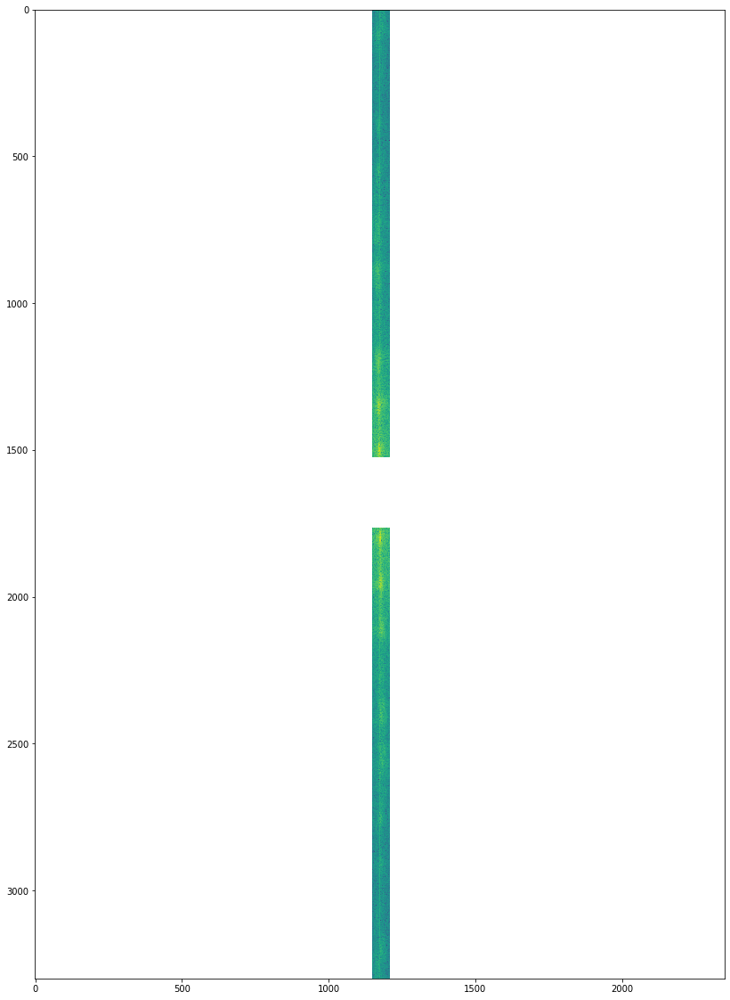

In [41]:
test9=imgX.copy()
test9[0: 3300-1, 0: 1150]=0
test9[0: 3300-1, 1210: 2350-1]=0

test9[1525:1765, 0: 2350-1]=0

#test5[2000:3300-1, 1150: 1210]=0
plt.figure(figsize=(30, 20))
plt.imshow(np.log(np.abs(test9)))



(-0.5, 2349.5, 3299.5, -0.5)

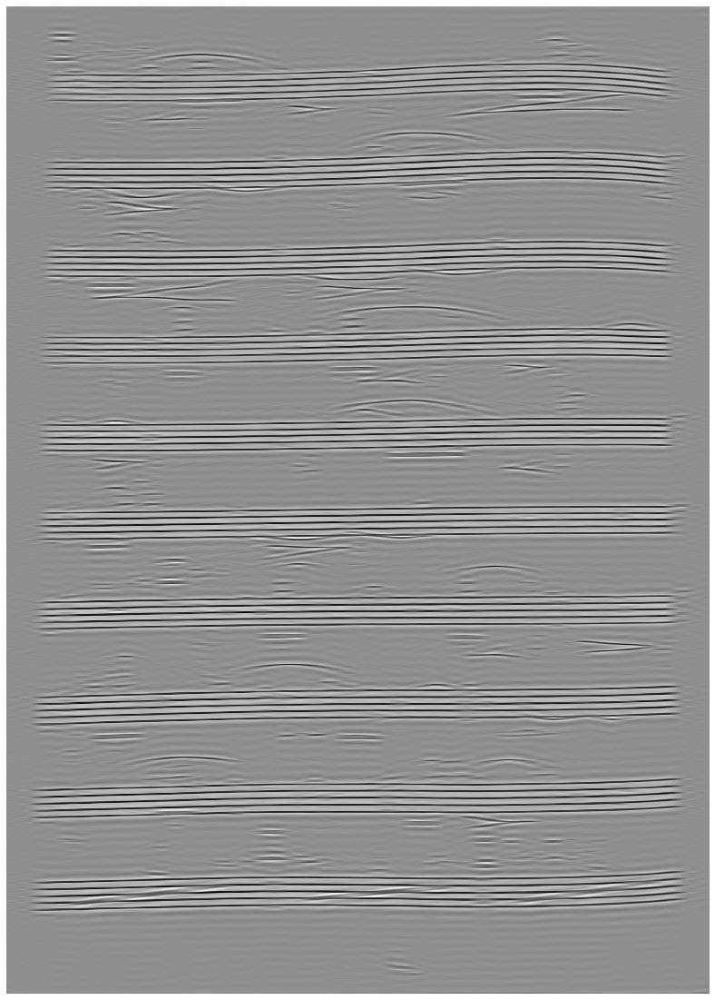

In [42]:
imgrecon9 = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((test9))))
plt.figure(figsize=(30, 20))
plt.imshow(imgrecon9, cmap=plt.cm.gray)
plt.axis('off')

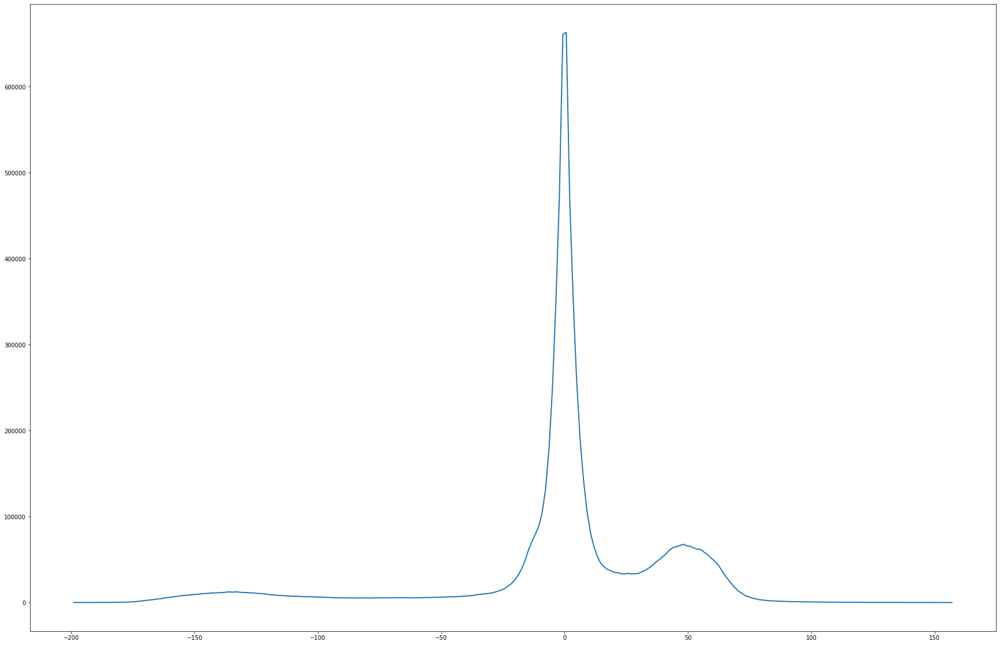

In [43]:
from skimage import exposure
plt.figure(figsize=(30, 20))
hist, bins_center = exposure.histogram(imgrecon9)
plt.plot(bins_center, hist, lw=2)
plt.show()

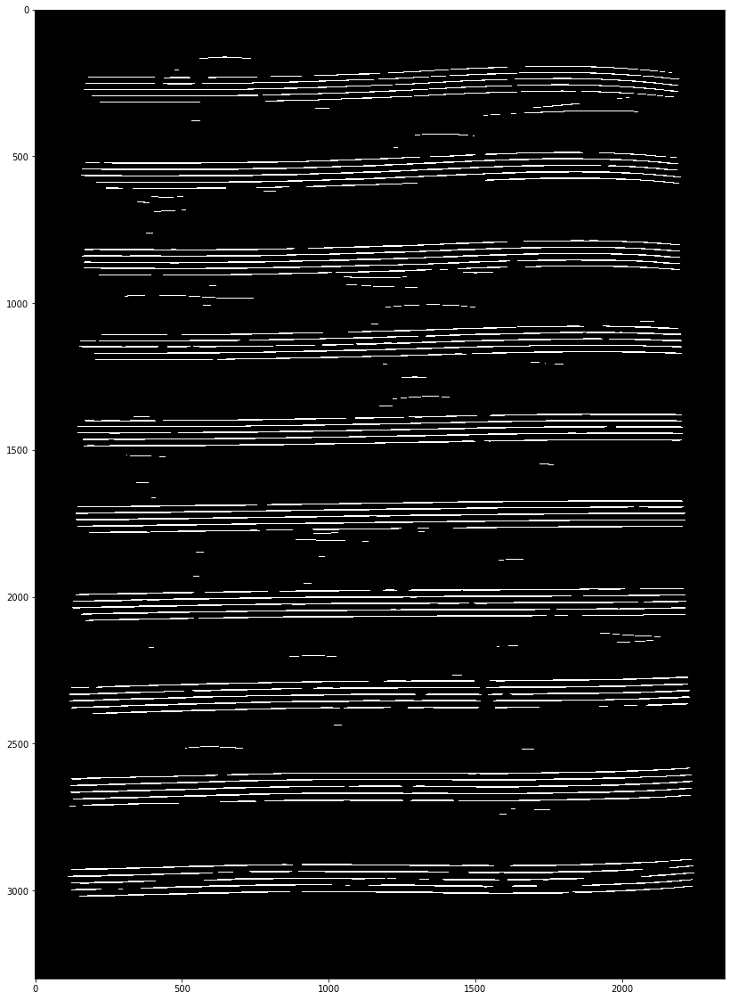

In [44]:

plt.figure(figsize=(30, 20))
plt.imshow(imgrecon9 < -100, cmap=plt.cm.gray)

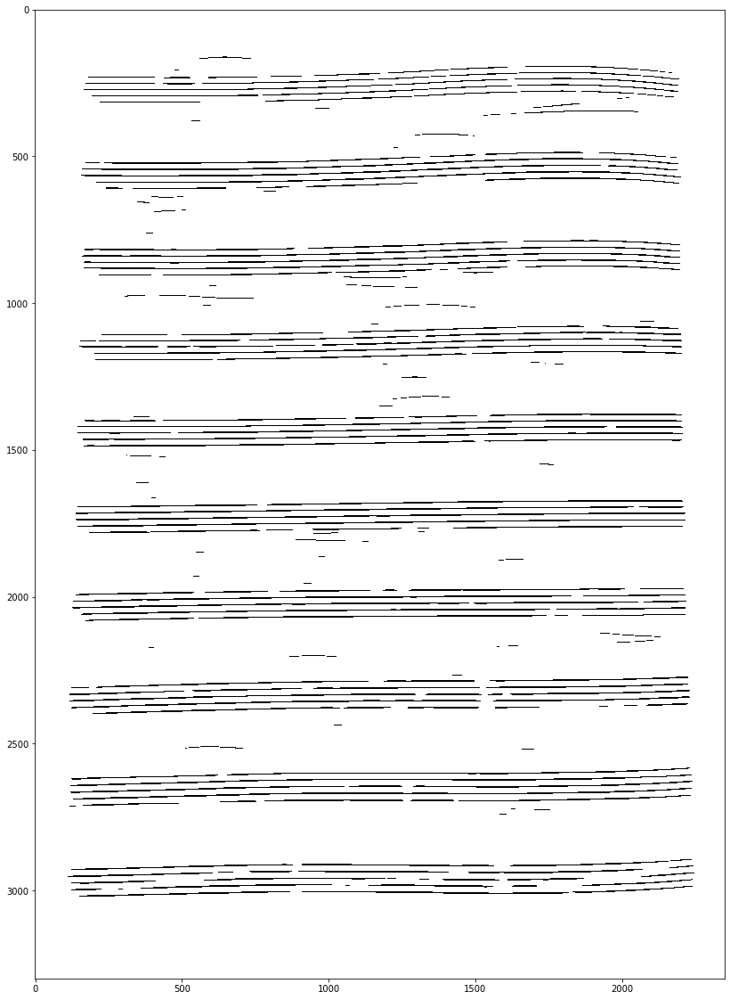

In [66]:
saveimg=imgrecon9.copy()
saveimg[saveimg > -100]=255
saveimg[saveimg <= -100]=0

plt.figure(figsize=(30, 20))
plt.imshow(saveimg, cmap=plt.cm.gray)

In [70]:
imageio.imwrite("extracted.png", saveimg)

Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


## Inverse test

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log
  


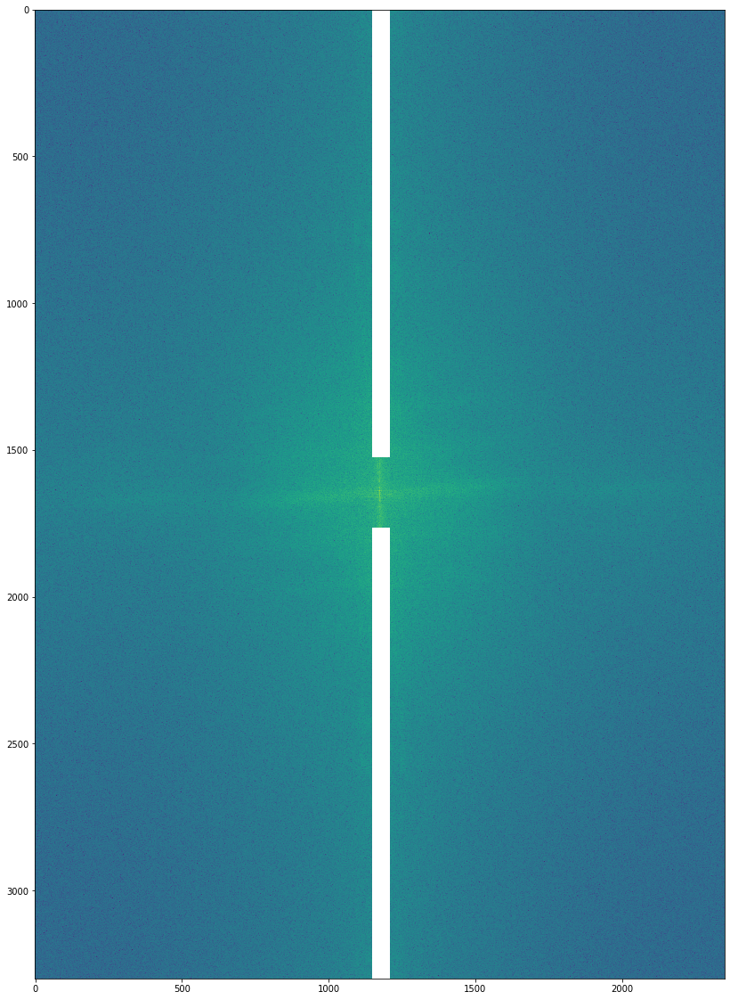

In [5]:
test_notes9=imgX.copy()
test_notes9[0:1525, 1150:1210]=0
test_notes9[1765: 3300-1, 1150:1210]=0


#test5[2000:3300-1, 1150: 1210]=0
plt.figure(figsize=(30, 20))
plt.imshow(np.log(np.abs(test_notes9)))



(-0.5, 2349.5, 3299.5, -0.5)

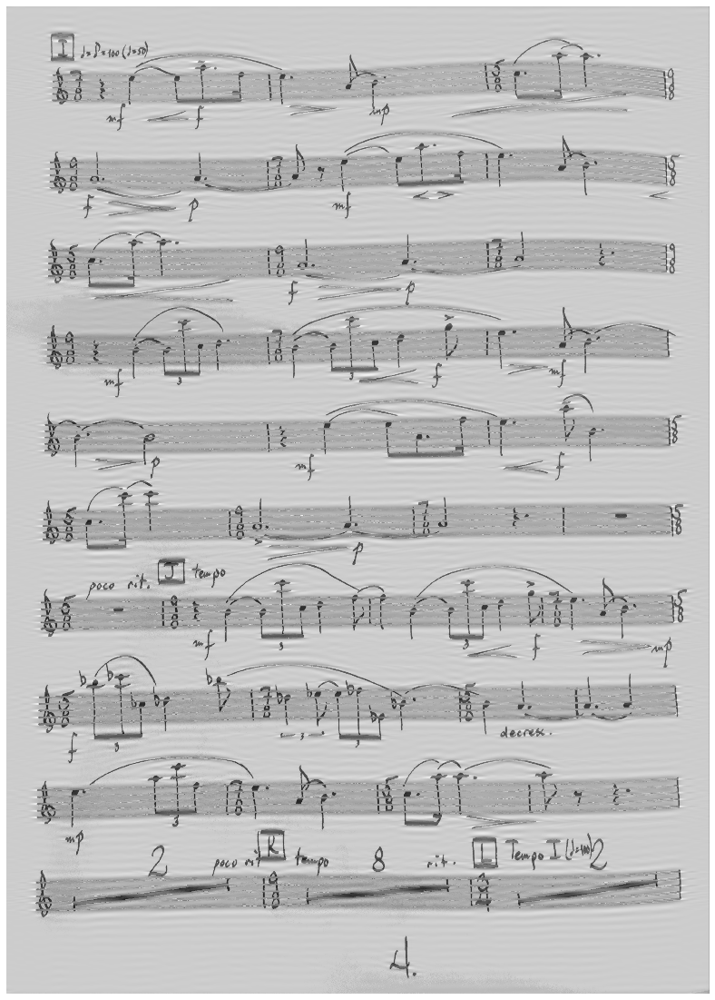

In [7]:
notes9 = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((test_notes9))))
plt.figure(figsize=(30, 20))
plt.imshow(notes9, cmap=plt.cm.gray)
plt.axis('off')

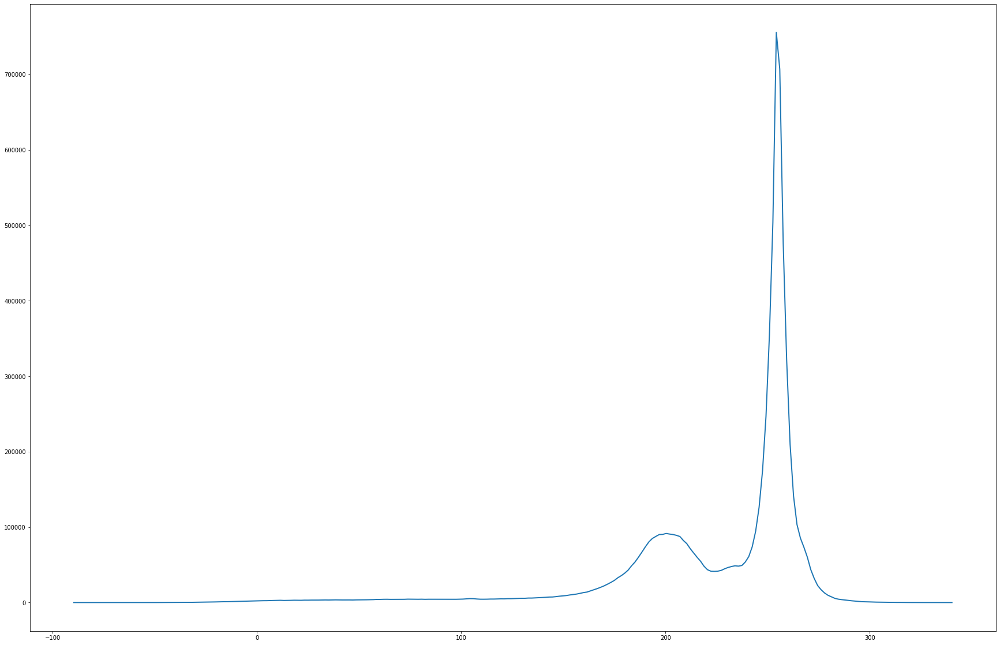

In [8]:
from skimage import exposure
plt.figure(figsize=(30, 20))
hist, bins_center = exposure.histogram(notes9)
plt.plot(bins_center, hist, lw=2)
plt.show()

(-0.5, 2349.5, 3299.5, -0.5)

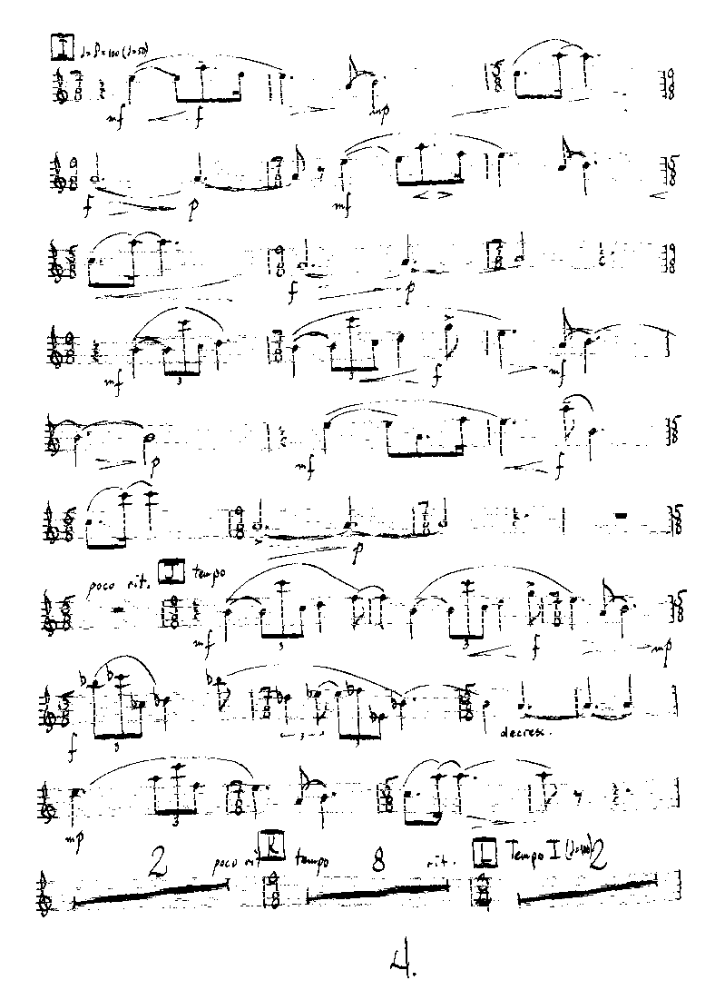

In [14]:
thresh_note9=150
plt.figure(figsize=(30, 20))
plt.imshow(~(notes9 < thresh_note9), cmap=plt.cm.gray)
plt.axis('off')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log
  # This is added back by InteractiveShellApp.init_path()


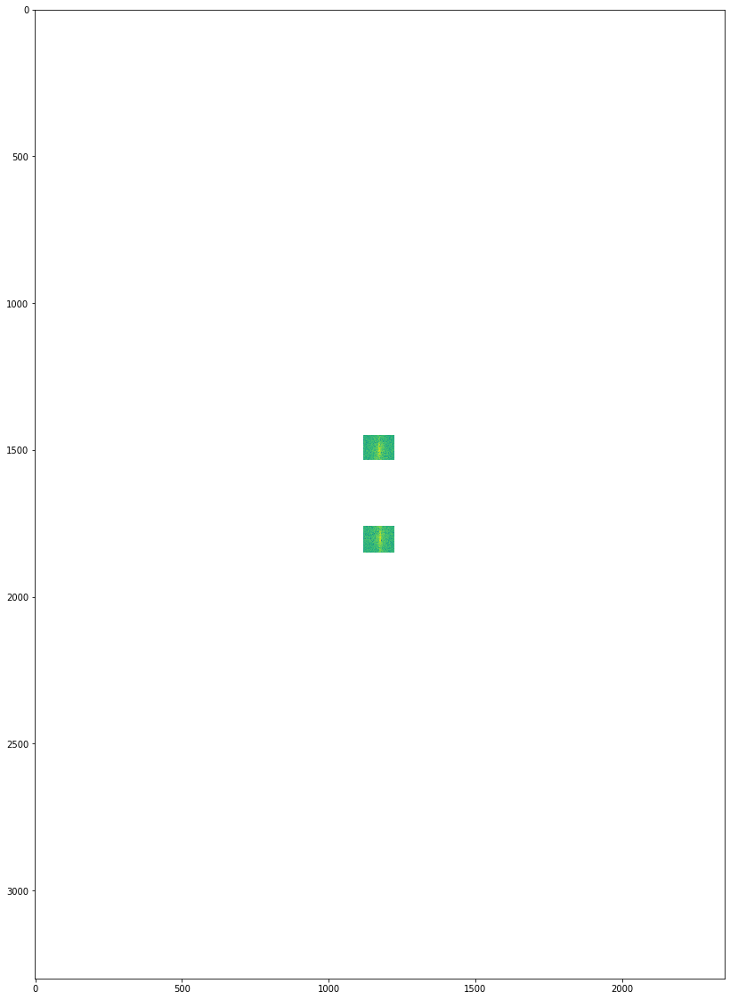

In [13]:
test10=imgX.copy()
test10[0: 3300-1, 0: 1120]=0
test10[0: 3300-1, 1225: 2350-1]=0

test10[1535:1760, 0: 2350-1]=0

test10[0:1450, 0: 2350-1]=0
test10[1850:3300-1, 0: 2350-1]=0
#test5[2000:3300-1, 1150: 1210]=0
plt.figure(figsize=(30, 20))
plt.imshow(np.log(np.abs(test10)))


(-0.5, 2349.5, 3299.5, -0.5)

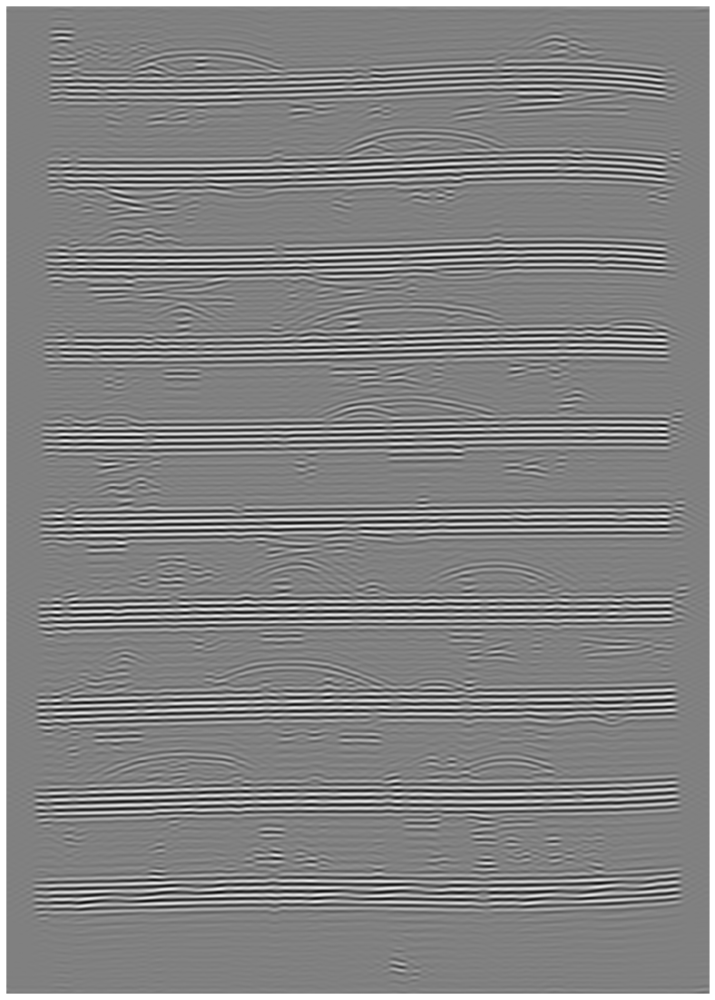

In [46]:
imgrecon10 = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((test10))))
plt.figure(figsize=(30, 20))
plt.imshow(imgrecon10, cmap=plt.cm.gray)
plt.axis('off')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log
  # This is added back by InteractiveShellApp.init_path()


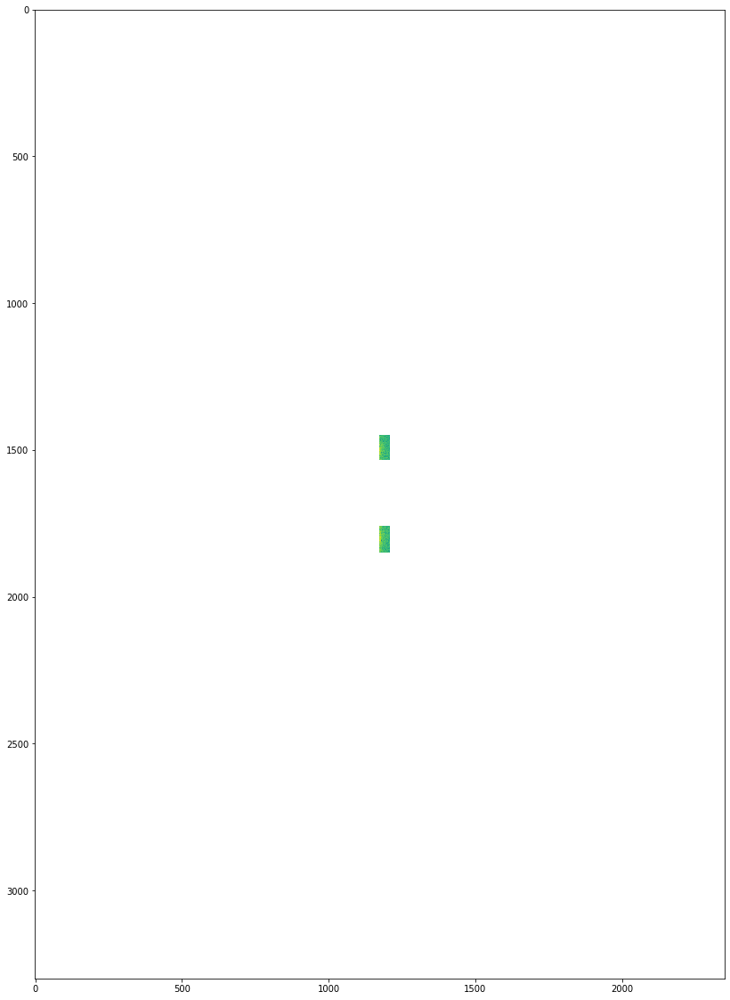

In [47]:
test11=imgX.copy()
test11[0: 3300-1, 0: 1175]=0
test11[0: 3300-1, 1210: 2350-1]=0

test11[1535:1760, 0: 2350-1]=0

test11[0:1450, 0: 2350-1]=0
test11[1850:3300-1, 0: 2350-1]=0
#test5[2000:3300-1, 1150: 1210]=0
plt.figure(figsize=(30, 20))
plt.imshow(np.log(np.abs(test11)))


In [48]:
np.max(imgrecon10)

129.77411837692873

In [49]:
np.min(imgrecon10)

-130.5760948593089

In [50]:
imgrecon10=(imgrecon10-np.min(imgrecon10))
imgrecon10=255*imgrecon10/np.max(imgrecon10)
imgrecon10=imgrecon10.astype(np.int)

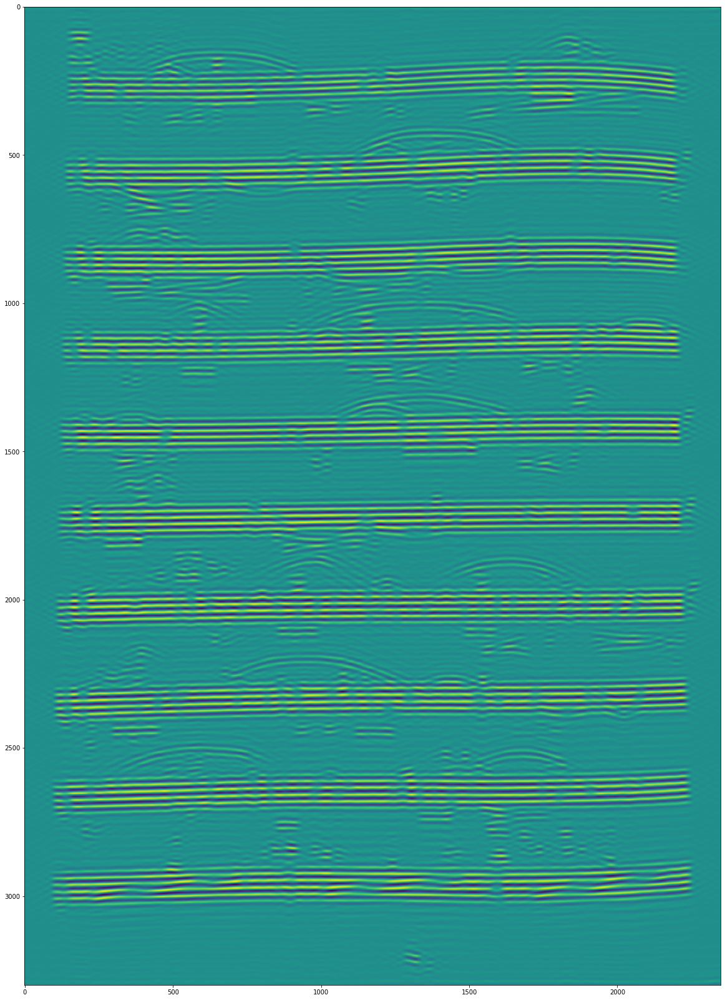

In [51]:
plt.figure(figsize=(20,30))
plt.imshow(imgrecon10)

# Testing on Blank Sheet

(-0.5, 2349.5, 3299.5, -0.5)

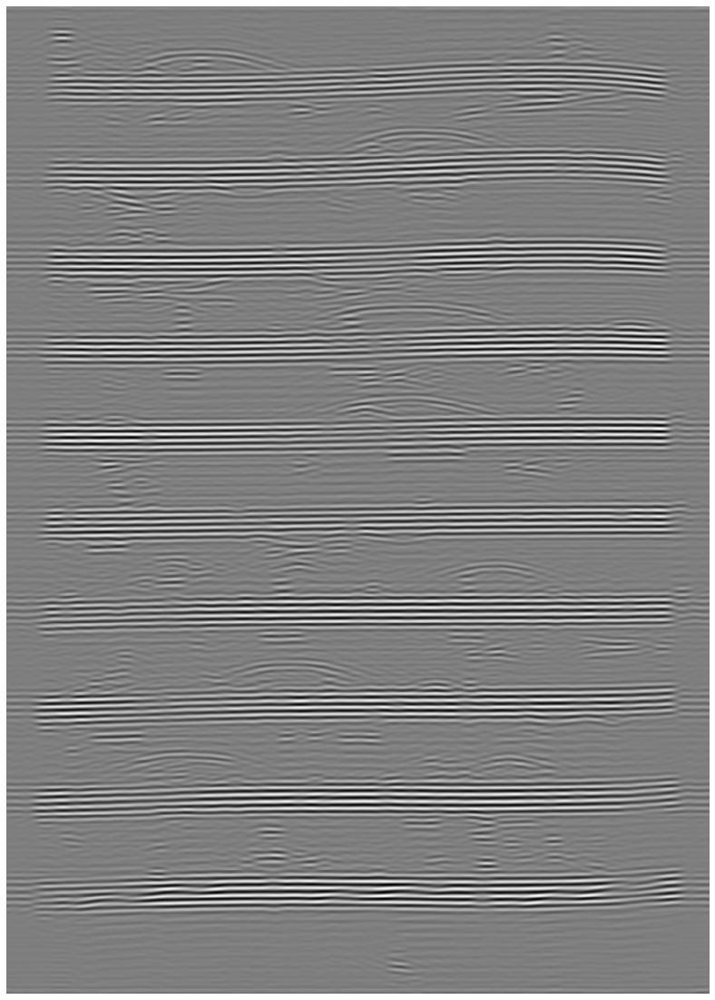

In [52]:
imgrecon11 = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((test11))))
plt.figure(figsize=(30, 20))
plt.imshow(imgrecon11, cmap=plt.cm.gray)
plt.axis('off')

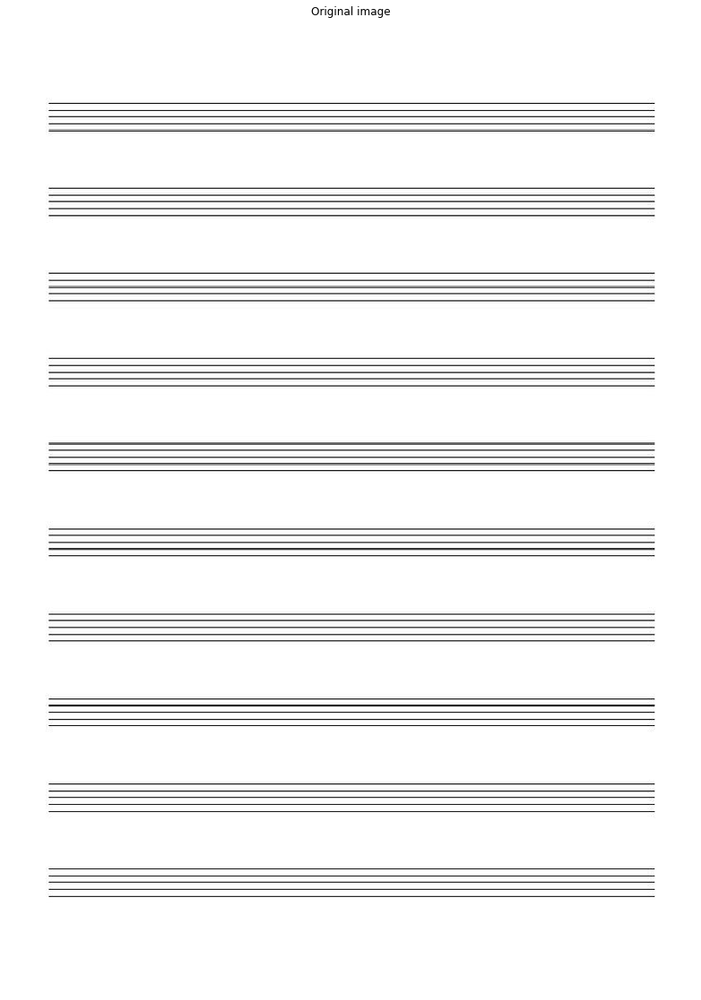

Text(0.5, 1.0, 'Amplitude spectrum')

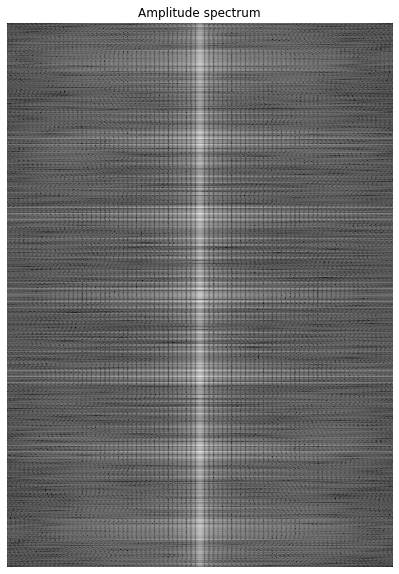

In [53]:
blank = np.asarray(Image.open("blank.jpg"))

red = blank[..., 0]
green = blank[..., 1]
blue = blank[..., 2]

blank = 0.21 * red + 0.72 * green + 0.07 * blue

# plot original image
plt.figure(figsize=(30, 20))
plt.imshow(blank, cmap=plt.cm.gray)
plt.axis('off')
plt.title('Original image')

plt.show()


# and its power spectrum
imgX_blank  = scipy.fftpack.fftshift(scipy.fftpack.fft2(blank))
powr2 = np.log(np.abs(imgX_blank))

plt.figure(figsize=(20, 10))
plt.imshow(powr2, cmap=plt.cm.gray)
plt.clim([0, 15])
plt.axis('off')
plt.title('Amplitude spectrum')

In [54]:
blank.shape

(995, 705)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log
  """


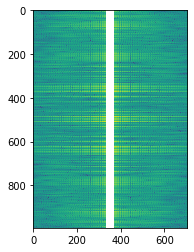

In [55]:
testblank_1=imgX_blank.copy()
testblank_1[0: 995-1, 330: 370]=0
#test5[2000:3300-1, 1150: 1210]=0
plt.figure()
plt.imshow(np.log(np.abs(testblank_1)))

(-0.5, 704.5, 994.5, -0.5)

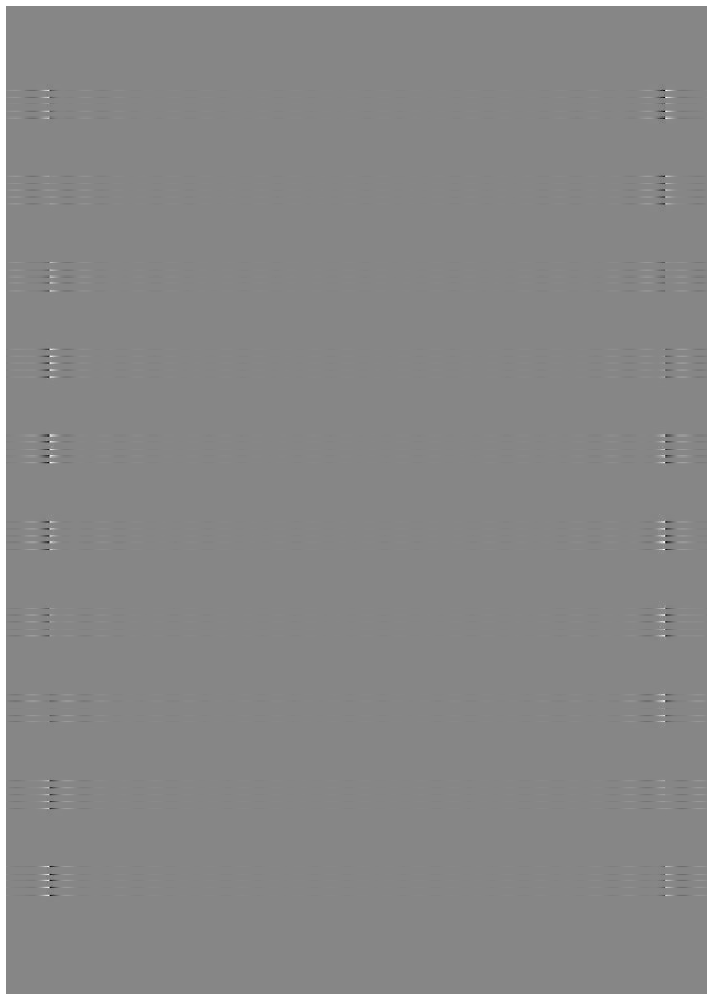

In [56]:
imgrecon_blank = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((testblank_1))))
plt.figure(figsize=(30, 20))
plt.imshow(imgrecon_blank, cmap=plt.cm.gray)
plt.axis('off')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in log
  import sys


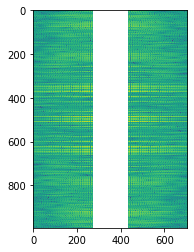

In [57]:
testblank_2=imgX_blank.copy()
testblank_2[0: 995-1, 275: 430]=0

#testblank_2[400: 600, 0: 705-1]=0
#testblank_2[600:700, 0: 705-1]=0
plt.figure()
plt.imshow(np.log(np.abs(testblank_2)))

(-0.5, 704.5, 994.5, -0.5)

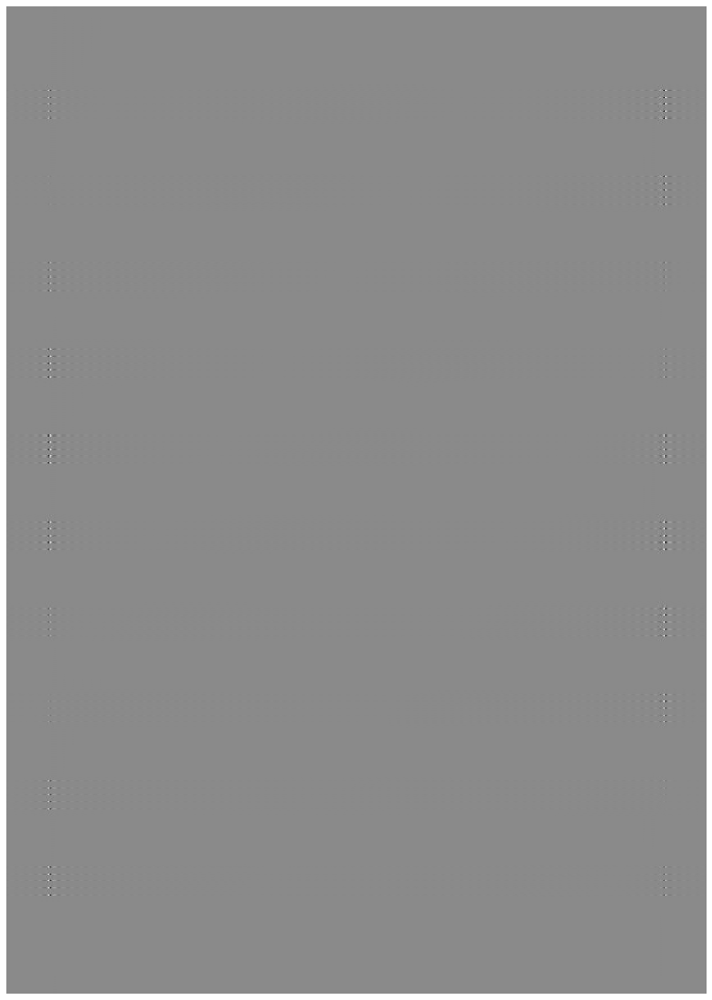

In [58]:
imgrecon_blank2 = np.real(scipy.fftpack.ifft2(scipy.fftpack.fftshift((testblank_2))))
plt.figure(figsize=(30, 20))
plt.imshow(imgrecon_blank2, cmap=plt.cm.gray)
plt.axis('off')